In [1]:
import plotly.express as px
import matplotlib.pyplot as plt

import pandas as pd
import numpy as np

from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import roc_auc_score
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.metrics import classification_report, accuracy_score, confusion_matrix
from sklearn.model_selection import train_test_split
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score

import warnings
warnings.filterwarnings('ignore')

In [2]:
df=pd.read_csv("Cerebral Stroke Prediction.csv")
df.head()

,id,gender,age,hypertension,heart_disease,ever_married,work_type,Residence_type,avg_glucose_level,bmi,smoking_status,stroke
0,30669,Male,3.0,0,0,No,children,Rural,95.12,18.0,NaN,0
1,30468,Male,58.0,1,0,Yes,Private,Urban,87.96,39.2,never smoked,0
2,16523,Female,8.0,0,0,No,Private,Urban,110.89,17.6,NaN,0
3,56543,Female,70.0,0,0,Yes,Private,Rural,69.04,35.9,formerly smoked,0
4,46136,Male,14.0,0,0,No,Never_worked,Rural,161.28,19.1,NaN,0


In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 43400 entries, 0 to 43399
Data columns (total 12 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   id                 43400 non-null  int64  
 1   gender             43400 non-null  object 
 2   age                43400 non-null  float64
 3   hypertension       43400 non-null  int64  
 4   heart_disease      43400 non-null  int64  
 5   ever_married       43400 non-null  object 
 6   work_type          43400 non-null  object 
 7   Residence_type     43400 non-null  object 
 8   avg_glucose_level  43400 non-null  float64
 9   bmi                41938 non-null  float64
 10  smoking_status     30108 non-null  object 
 11  stroke             43400 non-null  int64  
dtypes: float64(3), int64(4), object(5)
memory usage: 4.0+ MB


In [4]:
# Dropping column id as it doesn't provide any significant insight
df = df.drop('id', axis=1)

In [5]:
df

,gender,age,hypertension,heart_disease,ever_married,work_type,Residence_type,avg_glucose_level,bmi,smoking_status,stroke
0,Male,3.0,0,0,No,children,Rural,95.12,18.0,NaN,0
1,Male,58.0,1,0,Yes,Private,Urban,87.96,39.2,never smoked,0
2,Female,8.0,0,0,No,Private,Urban,110.89,17.6,NaN,0
3,Female,70.0,0,0,Yes,Private,Rural,69.04,35.9,formerly smoked,0
4,Male,14.0,0,0,No,Never_worked,Rural,161.28,19.1,NaN,0
...,...,...,...,...,...,...,...,...,...,...,...
43395,Female,10.0,0,0,No,children,Urban,58.64,20.4,never smoked,0
43396,Female,56.0,0,0,Yes,Govt_job,Urban,213.61,55.4,formerly smoked,0
43397,Female,82.0,1,0,Yes,Private,Urban,91.94,28.9,formerly smoked,0
43398,Male,40.0,0,0,Yes,Private,Urban,99.16,33.2,never smoked,0


# Handling missing values

In [6]:
df.isnull().sum()

gender                   0
age                      0
hypertension             0
heart_disease            0
ever_married             0
work_type                0
Residence_type           0
avg_glucose_level        0
bmi                   1462
smoking_status       13292
stroke                   0
dtype: int64

In [7]:
df.dropna(axis=0,how="any",inplace=True)
#Removing all the Null values

In [8]:
df.isnull().sum()

gender               0
age                  0
hypertension         0
heart_disease        0
ever_married         0
work_type            0
Residence_type       0
avg_glucose_level    0
bmi                  0
smoking_status       0
stroke               0
dtype: int64

In [9]:
df

#classsify into categorical and numerical
#label encode cat column
#and scale numerical col
#concatenate 
#after scaled and labeled enoded data concatente it
#split into x features and y target and pass this into x train y train

,gender,age,hypertension,heart_disease,ever_married,work_type,Residence_type,avg_glucose_level,bmi,smoking_status,stroke
1,Male,58.0,1,0,Yes,Private,Urban,87.96,39.2,never smoked,0
3,Female,70.0,0,0,Yes,Private,Rural,69.04,35.9,formerly smoked,0
6,Female,52.0,0,0,Yes,Private,Urban,77.59,17.7,formerly smoked,0
7,Female,75.0,0,1,Yes,Self-employed,Rural,243.53,27.0,never smoked,0
8,Female,32.0,0,0,Yes,Private,Rural,77.67,32.3,smokes,0
...,...,...,...,...,...,...,...,...,...,...,...
43395,Female,10.0,0,0,No,children,Urban,58.64,20.4,never smoked,0
43396,Female,56.0,0,0,Yes,Govt_job,Urban,213.61,55.4,formerly smoked,0
43397,Female,82.0,1,0,Yes,Private,Urban,91.94,28.9,formerly smoked,0
43398,Male,40.0,0,0,Yes,Private,Urban,99.16,33.2,never smoked,0


In [28]:
print(df.columns)

print(df.describe())

Index(['gender', 'age', 'hypertension', 'heart_disease', 'ever_married',
       'work_type', 'Residence_type', 'avg_glucose_level', 'bmi',
       'smoking_status', 'stroke'],
      dtype='object')
                age  hypertension  heart_disease  avg_glucose_level  \
count  29072.000000  29072.000000   29072.000000       29072.000000   
mean      47.671746      0.111482       0.052146         106.403225   
std       18.734490      0.314733       0.222326          45.268512   
min       10.000000      0.000000       0.000000          55.010000   
25%       32.000000      0.000000       0.000000          77.627500   
50%       48.000000      0.000000       0.000000          92.130000   
75%       62.000000      0.000000       0.000000         113.910000   
max       82.000000      1.000000       1.000000         291.050000   

                bmi        stroke  
count  29072.000000  29072.000000  
mean      30.054166      0.018850  
std        7.193908      0.135997  
min       10.100000

In [29]:
df.columns

Index(['gender', 'age', 'hypertension', 'heart_disease', 'ever_married',
       'work_type', 'Residence_type', 'avg_glucose_level', 'bmi',
       'smoking_status', 'stroke'],
      dtype='object')

In [30]:
df.head()

,gender,age,hypertension,heart_disease,ever_married,work_type,Residence_type,avg_glucose_level,bmi,smoking_status,stroke
1,Male,58.0,1,0,Yes,Private,Urban,87.96,39.2,never smoked,0
3,Female,70.0,0,0,Yes,Private,Rural,69.04,35.9,formerly smoked,0
6,Female,52.0,0,0,Yes,Private,Urban,77.59,17.7,formerly smoked,0
7,Female,75.0,0,1,Yes,Self-employed,Rural,243.53,27.0,never smoked,0
8,Female,32.0,0,0,Yes,Private,Rural,77.67,32.3,smokes,0


# DATA VISUALIZATION

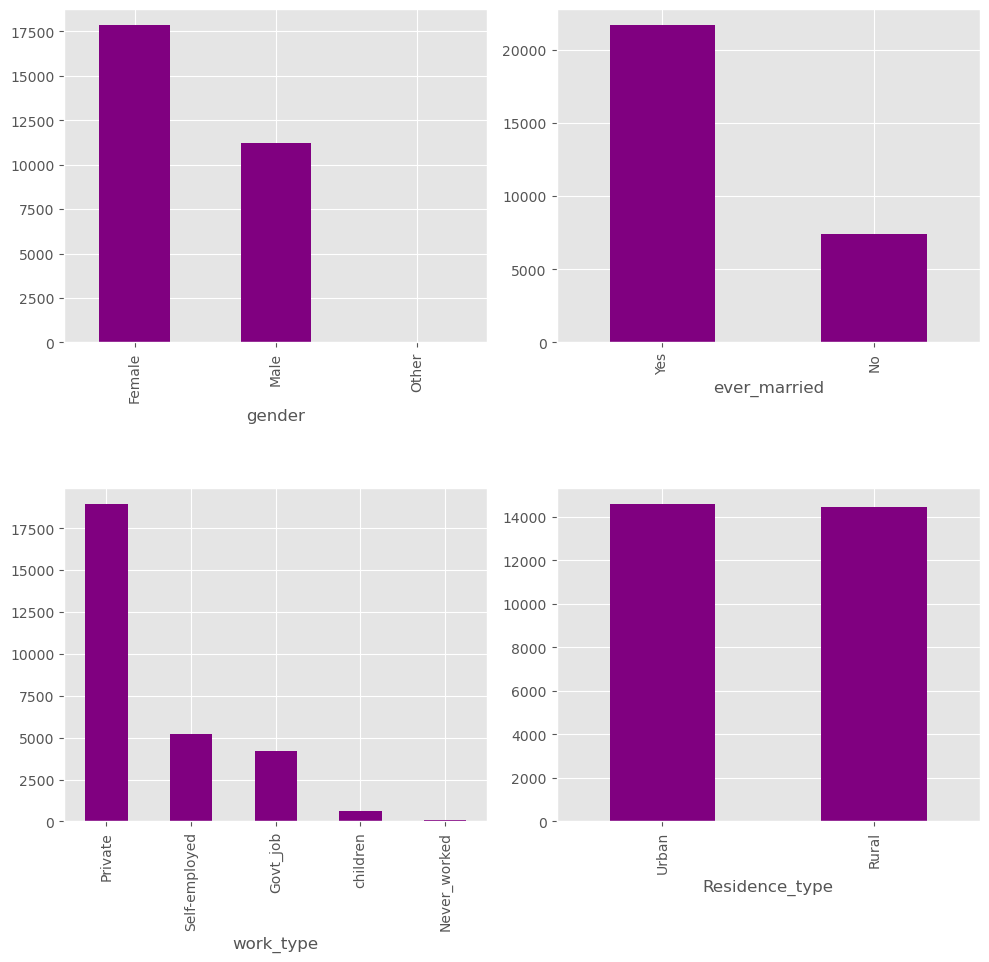

In [144]:
import matplotlib.pyplot as plt

plt.style.use('ggplot')
plt.figure(figsize=(10,18))

plt.subplot(421)
df['gender'].value_counts().plot(kind='bar', 
                                 color = 'purple')

plt.subplot(422)
df['ever_married'].value_counts().plot(kind='bar', 
                                       color = 'purple')


plt.subplot(423)
df['work_type'].value_counts().plot(kind='bar', 
                                    color = 'purple')

plt.subplot(424)
df['Residence_type'].value_counts().plot(kind='bar', 
                                         color = 'purple')
plt.tight_layout()


In [ ]:
#gender wise stroke prediction : Ratio of female is higher than male
#maritual status wise prediction: Ratio of married people is higher
#work wise stroke prediction : Ratio of people working in Private is higher
#Residence type: Ratio of people living in urban is higher

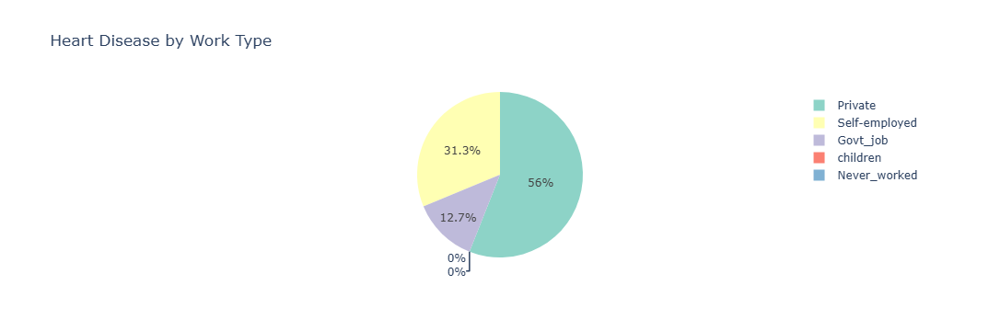

In [145]:
fig = px.pie(df, values='heart_disease', 
             names = 'work_type', 
             title = 'Heart Disease by Work Type',
             hover_data = ['gender'],
             color_discrete_sequence=pc.qualitative.Set3)
fig.show()

In [ ]:
#People working in Private have higher chances of getting stroke

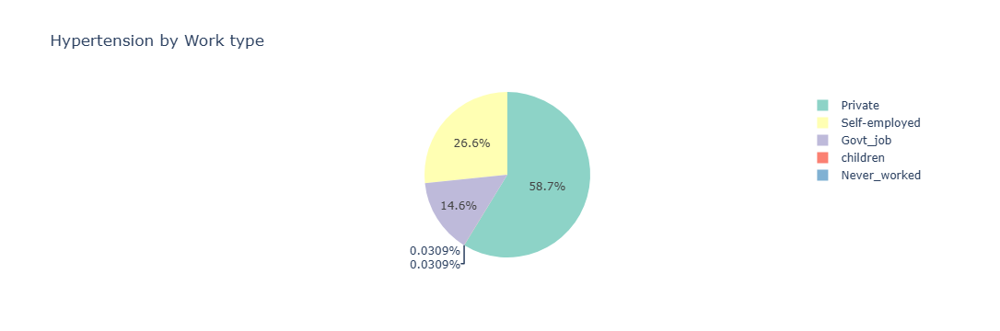

In [146]:
fig = px.pie(df, values='hypertension', 
             names = 'work_type', 
             title = 'Hypertension by Work type',
             hover_data = ['avg_glucose_level'],
             color_discrete_sequence=pc.qualitative.Set3)
fig.show()

In [ ]:
#People working in Private sector have higher chances of hypertension

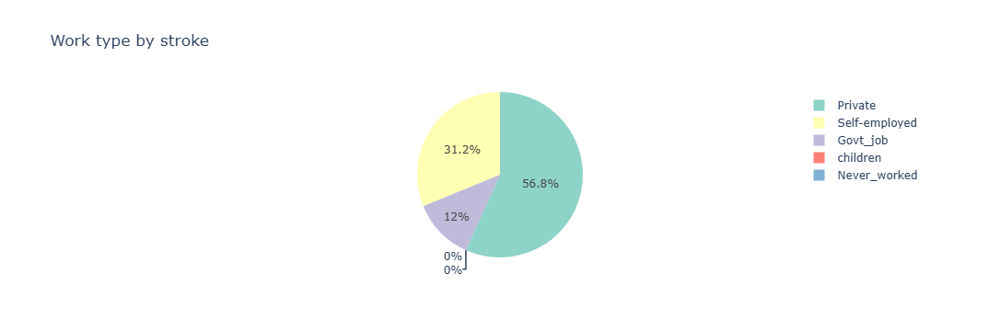

In [147]:
import plotly.colors as pc

fig = px.pie(df, values='stroke', 
             names='work_type', 
             title='Work type by stroke',
             hover_data=['Residence_type'],
             color_discrete_sequence=pc.qualitative.Set3)  # Using the Set3 color scale
fig.show()

In [ ]:
#People working in private sector have highest ratio of getting stroke

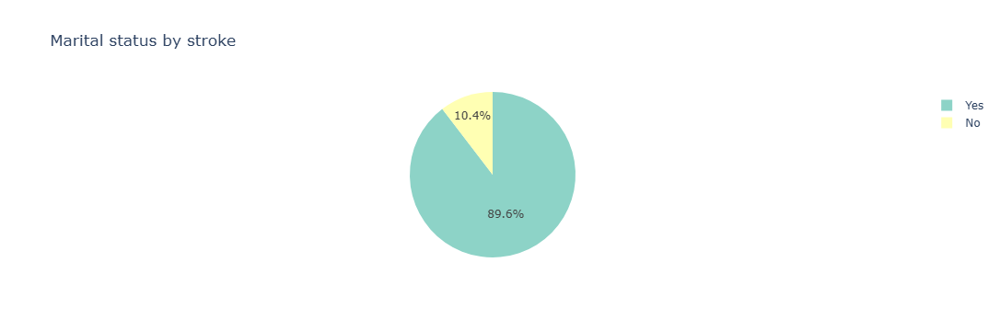

In [148]:
import plotly.express as px
import plotly.colors as pc

fig = px.pie(df, values='stroke', 
             names='ever_married', 
             title='Marital status by stroke',
             hover_data=['Residence_type'],
             color_discrete_sequence=pc.qualitative.Set3)  # Using the Set3 color scale
fig.show()

In [ ]:
#Married people have higher ratio of getting stroke than unmarried 

<Axes: xlabel='gender', ylabel='age'>

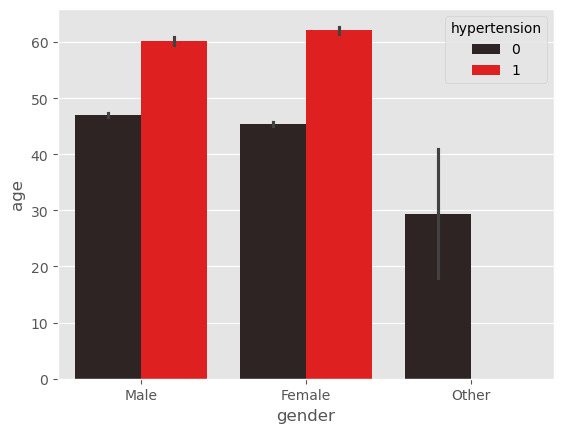

In [149]:
sns.barplot(x = 'gender', y='age', 
            data = df, hue = 'hypertension',color='red')

In [ ]:
#More than 65% female are suffering from Hypertension

<Axes: xlabel='gender', ylabel='age'>

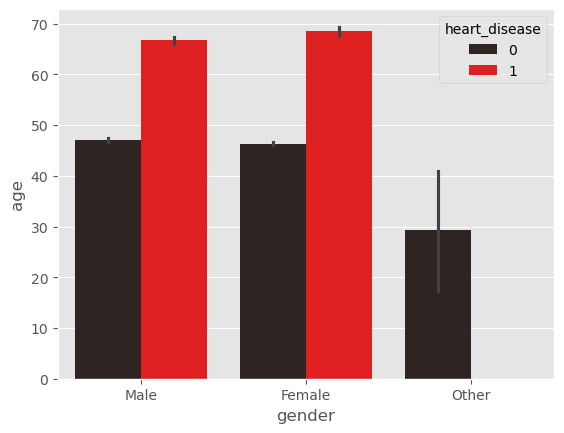

In [150]:
sns.barplot(x = 'gender', y='age', 
            data = df, hue = 'heart_disease',color='red')

In [ ]:
#More than 65% of female are suffering from Heart disease

<Axes: xlabel='age', ylabel='avg_glucose_level'>

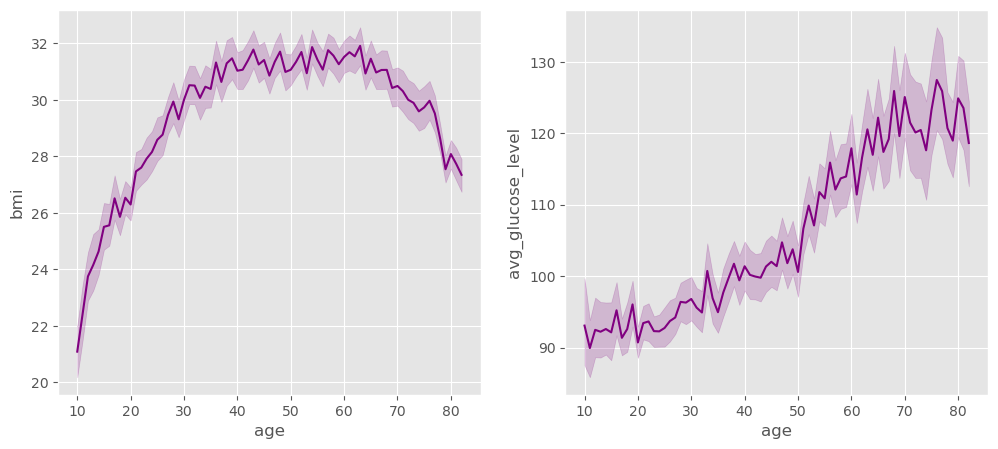

In [151]:
plt.figure(figsize=(12,5))
plt.subplot(121)
sns.lineplot(data=df, x='age', y='bmi',color='purple')

plt.subplot(122)
sns.lineplot(data=df, x='age', y='avg_glucose_level',color='purple')

In [ ]:
#Highest BMI is for age group between 60 to 70
#Highest glucose level is between age group 70 to 80

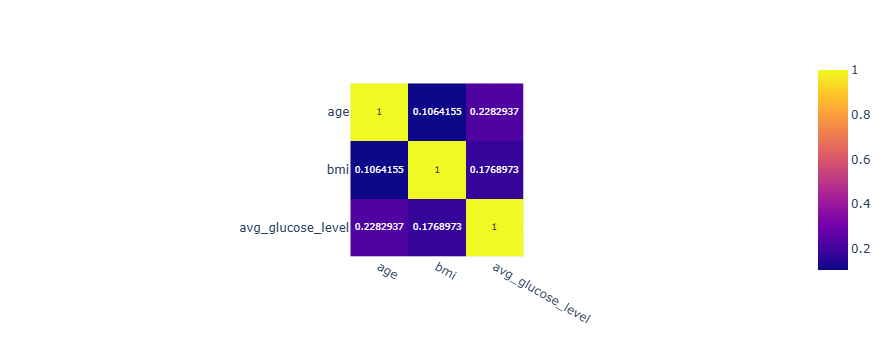

In [152]:
df_ = df[['age', 'bmi', 'avg_glucose_level']]
corr = df_.corr()
px.imshow(corr, text_auto=True)

In [ ]:
# Glucose level is positively co-related with age

# Seperating data into Categorical and Numerical

In [10]:
df.dtypes

gender                object
age                  float64
hypertension           int64
heart_disease          int64
ever_married          object
work_type             object
Residence_type        object
avg_glucose_level    float64
bmi                  float64
smoking_status        object
stroke                 int64
dtype: object

In [11]:
df

,gender,age,hypertension,heart_disease,ever_married,work_type,Residence_type,avg_glucose_level,bmi,smoking_status,stroke
1,Male,58.0,1,0,Yes,Private,Urban,87.96,39.2,never smoked,0
3,Female,70.0,0,0,Yes,Private,Rural,69.04,35.9,formerly smoked,0
6,Female,52.0,0,0,Yes,Private,Urban,77.59,17.7,formerly smoked,0
7,Female,75.0,0,1,Yes,Self-employed,Rural,243.53,27.0,never smoked,0
8,Female,32.0,0,0,Yes,Private,Rural,77.67,32.3,smokes,0
...,...,...,...,...,...,...,...,...,...,...,...
43395,Female,10.0,0,0,No,children,Urban,58.64,20.4,never smoked,0
43396,Female,56.0,0,0,Yes,Govt_job,Urban,213.61,55.4,formerly smoked,0
43397,Female,82.0,1,0,Yes,Private,Urban,91.94,28.9,formerly smoked,0
43398,Male,40.0,0,0,Yes,Private,Urban,99.16,33.2,never smoked,0


In [12]:
# Select numerical columns from the DataFrame
data_num = df.select_dtypes(["int", "float"])

#display the numerical columns
data_num

,age,hypertension,heart_disease,avg_glucose_level,bmi,stroke
1,58.0,1,0,87.96,39.2,0
3,70.0,0,0,69.04,35.9,0
6,52.0,0,0,77.59,17.7,0
7,75.0,0,1,243.53,27.0,0
8,32.0,0,0,77.67,32.3,0
...,...,...,...,...,...,...
43395,10.0,0,0,58.64,20.4,0
43396,56.0,0,0,213.61,55.4,0
43397,82.0,1,0,91.94,28.9,0
43398,40.0,0,0,99.16,33.2,0


# Reset row index of Numerical column

In [30]:
new_data_num=data_num.reset_index(drop=True, inplace=True)
new_data_num

In [31]:
data_num

,age,hypertension,heart_disease,avg_glucose_level,bmi,stroke
0,58.0,1,0,87.96,39.2,0
1,70.0,0,0,69.04,35.9,0
2,52.0,0,0,77.59,17.7,0
3,75.0,0,1,243.53,27.0,0
4,32.0,0,0,77.67,32.3,0
...,...,...,...,...,...,...
29067,10.0,0,0,58.64,20.4,0
29068,56.0,0,0,213.61,55.4,0
29069,82.0,1,0,91.94,28.9,0
29070,40.0,0,0,99.16,33.2,0


# Reset row index number of categorical column

In [19]:
# Select categorical columns from the DataFrame
data_cat = df.select_dtypes(["object"])

#display the numerical columns
data_cat

,gender,ever_married,work_type,Residence_type,smoking_status
1,Male,Yes,Private,Urban,never smoked
3,Female,Yes,Private,Rural,formerly smoked
6,Female,Yes,Private,Urban,formerly smoked
7,Female,Yes,Self-employed,Rural,never smoked
8,Female,Yes,Private,Rural,smokes
...,...,...,...,...,...
43395,Female,No,children,Urban,never smoked
43396,Female,Yes,Govt_job,Urban,formerly smoked
43397,Female,Yes,Private,Urban,formerly smoked
43398,Male,Yes,Private,Urban,never smoked


# Reset row index number

In [ ]:
new_data_cat=data_cat.reset_index(drop=True, inplace=True)
new_data_cat

In [27]:
new_data_cat=data_cat.reset_index(drop=True, inplace=True)
new_data_cat

In [28]:
data_cat

,gender,ever_married,work_type,Residence_type,smoking_status
0,Male,Yes,Private,Urban,never smoked
1,Female,Yes,Private,Rural,formerly smoked
2,Female,Yes,Private,Urban,formerly smoked
3,Female,Yes,Self-employed,Rural,never smoked
4,Female,Yes,Private,Rural,smokes
...,...,...,...,...,...
29067,Female,No,children,Urban,never smoked
29068,Female,Yes,Govt_job,Urban,formerly smoked
29069,Female,Yes,Private,Urban,formerly smoked
29070,Male,Yes,Private,Urban,never smoked


# Label Encoding

In [32]:
# Importing the LabelEncoder from scikit-learn for encoding categorical variables
from sklearn.preprocessing import LabelEncoder

In [33]:
# Create a LabelEncoder instance
le = LabelEncoder()

# Apply LabelEncoder to each categorical column
for i in data_cat:
    data_cat[i] = le.fit_transform(data_cat[i])

# Display the encoded categorical data
data_cat

,gender,ever_married,work_type,Residence_type,smoking_status
0,1,1,2,1,1
1,0,1,2,0,0
2,0,1,2,1,0
3,0,1,3,0,1
4,0,1,2,0,2
...,...,...,...,...,...
29067,0,0,4,1,1
29068,0,1,0,1,0
29069,0,1,2,1,0
29070,1,1,2,1,1


# Feature Scaling

In [34]:
# Importing StandardScaler from scikit-learn for feature scaling
from sklearn.preprocessing import StandardScaler

In [35]:
# Create an instance of StandardScaler for feature scaling
sc = StandardScaler()

In [36]:
# Scale the numerical features using StandardScaler
x_scaled = sc.fit_transform(data_num)

# Display the scaled numerical features
x_scaled

array([[ 0.55130571,  2.82313141, -0.23455328, -0.40742541,  1.27135241,
        -0.13860697],
       [ 1.19184656, -0.3542166 , -0.23455328, -0.82538316,  0.81262303,
        -0.13860697],
       [ 0.23103529, -0.3542166 , -0.23455328, -0.6365069 , -1.71733898,
        -0.13860697],
       ...,
       [ 1.83238741,  2.82313141, -0.23455328, -0.31950406, -0.16043928,
        -0.13860697],
       [-0.40950556, -0.3542166 , -0.23455328, -0.16000856,  0.437299  ,
        -0.13860697],
       [ 1.83238741, -0.3542166 , -0.23455328, -0.59475531, -1.31421317,
        -0.13860697]])

In [37]:
# Convert the scaled numerical data back to a DataFrame with original column names
data_num = pd.DataFrame(data = x_scaled,columns = data_num.columns)

# Display the DataFrame with scaled numerical features
data_num

,age,hypertension,heart_disease,avg_glucose_level,bmi,stroke
0,0.551306,2.823131,-0.234553,-0.407425,1.271352,-0.138607
1,1.191847,-0.354217,-0.234553,-0.825383,0.812623,-0.138607
2,0.231035,-0.354217,-0.234553,-0.636507,-1.717339,-0.138607
3,1.458739,-0.354217,4.263424,3.029239,-0.424556,-0.138607
4,-0.836533,-0.354217,-0.234553,-0.634740,0.312191,-0.138607
...,...,...,...,...,...,...
29067,-2.010858,-0.354217,-0.234553,-1.055127,-1.342015,-0.138607
29068,0.444549,-0.354217,-0.234553,2.368282,3.523297,-0.138607
29069,1.832387,2.823131,-0.234553,-0.319504,-0.160439,-0.138607
29070,-0.409506,-0.354217,-0.234553,-0.160009,0.437299,-0.138607


# Concatenating numerical data and categorical data

In [44]:
# Concatenate the scaled numerical features with the categorical data
data_new = pd.concat([data_num,data_cat],axis = 1)

# Display the combined DataFrame with scaled numerical features and label encoded categorical data
data_new

,age,hypertension,heart_disease,avg_glucose_level,bmi,stroke,gender,ever_married,work_type,Residence_type,smoking_status
0,0.551306,2.823131,-0.234553,-0.407425,1.271352,-0.138607,1,1,2,1,1
1,1.191847,-0.354217,-0.234553,-0.825383,0.812623,-0.138607,0,1,2,0,0
2,0.231035,-0.354217,-0.234553,-0.636507,-1.717339,-0.138607,0,1,2,1,0
3,1.458739,-0.354217,4.263424,3.029239,-0.424556,-0.138607,0,1,3,0,1
4,-0.836533,-0.354217,-0.234553,-0.634740,0.312191,-0.138607,0,1,2,0,2
...,...,...,...,...,...,...,...,...,...,...,...
29067,-2.010858,-0.354217,-0.234553,-1.055127,-1.342015,-0.138607,0,0,4,1,1
29068,0.444549,-0.354217,-0.234553,2.368282,3.523297,-0.138607,0,1,0,1,0
29069,1.832387,2.823131,-0.234553,-0.319504,-0.160439,-0.138607,0,1,2,1,0
29070,-0.409506,-0.354217,-0.234553,-0.160009,0.437299,-0.138607,1,1,2,1,1


In [46]:
data_new

,age,hypertension,heart_disease,avg_glucose_level,bmi,stroke,gender,ever_married,work_type,Residence_type,smoking_status
0,0.551306,2.823131,-0.234553,-0.407425,1.271352,-0.138607,1,1,2,1,1
1,1.191847,-0.354217,-0.234553,-0.825383,0.812623,-0.138607,0,1,2,0,0
2,0.231035,-0.354217,-0.234553,-0.636507,-1.717339,-0.138607,0,1,2,1,0
3,1.458739,-0.354217,4.263424,3.029239,-0.424556,-0.138607,0,1,3,0,1
4,-0.836533,-0.354217,-0.234553,-0.634740,0.312191,-0.138607,0,1,2,0,2
...,...,...,...,...,...,...,...,...,...,...,...
29067,-2.010858,-0.354217,-0.234553,-1.055127,-1.342015,-0.138607,0,0,4,1,1
29068,0.444549,-0.354217,-0.234553,2.368282,3.523297,-0.138607,0,1,0,1,0
29069,1.832387,2.823131,-0.234553,-0.319504,-0.160439,-0.138607,0,1,2,1,0
29070,-0.409506,-0.354217,-0.234553,-0.160009,0.437299,-0.138607,1,1,2,1,1


# Splitting data into X & Y

In [47]:
x_new=data_new.iloc[:,:-1]
x_new

,age,hypertension,heart_disease,avg_glucose_level,bmi,stroke,gender,ever_married,work_type,Residence_type
0,0.551306,2.823131,-0.234553,-0.407425,1.271352,-0.138607,1,1,2,1
1,1.191847,-0.354217,-0.234553,-0.825383,0.812623,-0.138607,0,1,2,0
2,0.231035,-0.354217,-0.234553,-0.636507,-1.717339,-0.138607,0,1,2,1
3,1.458739,-0.354217,4.263424,3.029239,-0.424556,-0.138607,0,1,3,0
4,-0.836533,-0.354217,-0.234553,-0.634740,0.312191,-0.138607,0,1,2,0
...,...,...,...,...,...,...,...,...,...,...
29067,-2.010858,-0.354217,-0.234553,-1.055127,-1.342015,-0.138607,0,0,4,1
29068,0.444549,-0.354217,-0.234553,2.368282,3.523297,-0.138607,0,1,0,1
29069,1.832387,2.823131,-0.234553,-0.319504,-0.160439,-0.138607,0,1,2,1
29070,-0.409506,-0.354217,-0.234553,-0.160009,0.437299,-0.138607,1,1,2,1


In [48]:
y_new=data_new.iloc[:,-1]
y_new

0        1
1        0
2        0
3        1
4        2
        ..
29067    1
29068    0
29069    0
29070    1
29071    1
Name: smoking_status, Length: 29072, dtype: int32

In [49]:
from sklearn.model_selection import train_test_split

In [50]:
X_train,X_test,y_train,y_test=train_test_split(x_new,y_new,train_size=0.80,random_state=42)

In [51]:
X_train.shape

(23257, 10)

In [52]:
X_test.shape

(5815, 10)

In [53]:
y_train.shape

(23257,)

In [54]:
y_test.shape

(5815,)

# Classification Report

In [55]:
lreg=LogisticRegression()
knn=KNeighborsClassifier()
dt=DecisionTreeClassifier()
rf=RandomForestClassifier()

def mymodel(model):
    model.fit(X_train,y_train)
    ypred=model.predict(X_test)
    ac=accuracy_score(y_test,ypred)
    cr=classification_report(y_test,ypred)
    print(f"Accuracy: {ac} \n Classification report:\n {cr}")

In [56]:
mymodel(lreg)

Accuracy: 0.5516766981943251 
 Classification report:
               precision    recall  f1-score   support

           0       0.46      0.13      0.20      1404
           1       0.56      0.96      0.70      3163
           2       0.80      0.00      0.01      1248

    accuracy                           0.55      5815
   macro avg       0.61      0.36      0.30      5815
weighted avg       0.59      0.55      0.43      5815



In [57]:
mymodel(knn)

Accuracy: 0.4770421324161651 
 Classification report:
               precision    recall  f1-score   support

           0       0.29      0.32      0.31      1404
           1       0.57      0.69      0.63      3163
           2       0.29      0.11      0.16      1248

    accuracy                           0.48      5815
   macro avg       0.39      0.37      0.36      5815
weighted avg       0.45      0.48      0.45      5815



In [58]:
mymodel(dt)

Accuracy: 0.4307824591573517 
 Classification report:
               precision    recall  f1-score   support

           0       0.28      0.28      0.28      1404
           1       0.57      0.56      0.57      3163
           2       0.26      0.27      0.27      1248

    accuracy                           0.43      5815
   macro avg       0.37      0.37      0.37      5815
weighted avg       0.43      0.43      0.43      5815



In [59]:
mymodel(rf)

Accuracy: 0.506792777300086 
 Classification report:
               precision    recall  f1-score   support

           0       0.35      0.23      0.28      1404
           1       0.57      0.77      0.66      3163
           2       0.28      0.14      0.19      1248

    accuracy                           0.51      5815
   macro avg       0.40      0.38      0.37      5815
weighted avg       0.46      0.51      0.47      5815



# Logistic Regression 

In [60]:
from sklearn.linear_model import LogisticRegression

log_reg = LogisticRegression(max_iter=100, random_state=42)
log_reg.fit(X_train, y_train)

from sklearn.metrics import accuracy_score

# Predict on test set
y_pred_log_reg = log_reg.predict(X_test)

# Evaluate the model
logistic_accuracy = accuracy_score(y_test, y_pred_log_reg)*100
print(f"Logistic Regression Accuracy: {logistic_accuracy}")

Logistic Regression Accuracy: 55.167669819432504


# Logistic regression hypertune

In [61]:
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report, accuracy_score, confusion_matrix


# Define the parameter grid
param_grid = {
    'C': [0.01, 0.1, 1, 10, 100],
    'penalty': ['l1', 'l2', 'elasticnet', 'none'],
    'solver': ['lbfgs', 'liblinear', 'saga'],
    'max_iter': [100, 200, 500]
}

# Initialize the Logistic Regression model
log_reg = LogisticRegression()

# Perform Grid Search
grid_search = GridSearchCV(estimator=log_reg, param_grid=param_grid, cv=5, verbose=2, n_jobs=-1)
grid_search.fit(X_train, y_train)

# Best parameters found
print("Best parameters found: ", grid_search.best_params_)

# Train the model using the best parameters
best_log_reg = grid_search.best_estimator_

# Make predictions
y_pred = best_log_reg.predict(X_test)

# Evaluate the model
print("Accuracy:", accuracy_score(y_test, y_pred))

Fitting 5 folds for each of 180 candidates, totalling 900 fits
Best parameters found:  {'C': 1, 'max_iter': 100, 'penalty': 'l1', 'solver': 'liblinear'}
Accuracy: 0.5513327601031814


# KNN Algorithm

In [62]:
from sklearn.model_selection import train_test_split
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score

# Initialize and train the KNN model
knn = KNeighborsClassifier(n_neighbors=5)  # You can change n_neighbors as needed
knn.fit(X_train, y_train)

# Predict on test set
y_pred_knn = knn.predict(X_test)

# Evaluate the model
knn_accuracy = accuracy_score(y_test, y_pred_knn) * 100
print(f"KNN Accuracy: { knn_accuracy:.2f}%")

KNN Accuracy: 47.70%


# Random Forest

In [63]:
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score


# Initialize and train the Random Forest model
rf_model = RandomForestClassifier(n_estimators=100, random_state=42)  # You can adjust n_estimators
rf_model.fit(X_train, y_train)

# Predict on test set
y_pred_rf = rf_model.predict(X_test)

# Evaluate the model
random_forest_accuracy = accuracy_score(y_test, y_pred_rf) * 100
print(f"Random Forest Accuracy: {random_forest_accuracy:.2f}%")

Random Forest Accuracy: 50.49%


# Decision Tree

In [64]:
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import classification_report, accuracy_score, confusion_matrix

# Define the classifier
clf = DecisionTreeClassifier()

# Train the model
clf.fit(X_train, y_train)

# Make predictions
decision_tree_accuracy = clf.predict(X_test)

# Evaluate the model
print("Accuracy:", accuracy_score(y_test,decision_tree_accuracy)*100)
#print("Confusion Matrix:\n", confusion_matrix(y_test, y_pred))
#print("Classification Report:\n", classification_report(y_test, y_pred))

Accuracy: 42.97506448839209


# Hypertuning Decision Tree

In [65]:
# Define the parameter grid
param_grid = {
    'max_depth': [3, 5, 10, None],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
    'criterion': ['gini', 'entropy']
}

# Initialize the Decision Tree Classifier
dt_classifier = DecisionTreeClassifier(random_state=42)

# Initialize GridSearchCV
grid_search = GridSearchCV(estimator=dt_classifier, param_grid=param_grid, cv=5, n_jobs=-1, verbose=2)

# Fit the model
grid_search.fit(X_train, y_train)

# Get the best parameters
print("Best Parameters:", grid_search.best_params_)

# Predict using the best model
best_model = grid_search.best_estimator_
y_pred = best_model.predict(X_test)

# Calculate and print the accuracy score
decision_tree_accuracy = accuracy_score(y_test, y_pred)*100
print(f"Decision Tree - Best Model Accuracy:, {decision_tree_accuracy:.2f}%")

Fitting 5 folds for each of 72 candidates, totalling 360 fits
Best Parameters: {'criterion': 'entropy', 'max_depth': 5, 'min_samples_leaf': 1, 'min_samples_split': 2}
Decision Tree - Best Model Accuracy:, 55.15%


# Creating DataFrame to display Accuracies

In [66]:
accuracy_df = pd.DataFrame({
    'Model': ['Logistic Regression', 'KNN', 'Decision Tree', 'Random Forest'],
    'Accuracy': [logistic_accuracy, knn_accuracy, decision_tree_accuracy, random_forest_accuracy]
})

print(accuracy_df)

                 Model   Accuracy
0  Logistic Regression  55.167670
1                  KNN  47.704213
2        Decision Tree  55.150473
3        Random Forest  50.490112


# ROC AUC for Logistic Regression

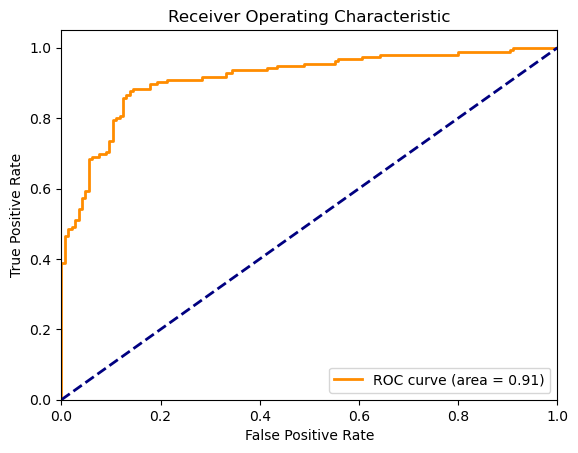

In [68]:
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.datasets import make_classification

# Generate a synthetic dataset (or use your own dataset)
X, y = make_classification(n_samples=1000, n_features=20, n_classes=2, random_state=42)

# Split the dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# Train the logistic regression model
model = LogisticRegression()
model.fit(X_train, y_train)

# Predict probabilities
y_probs = model.predict_proba(X_test)[:, 1]

# Compute the ROC curve and AUC
fpr, tpr, _ = roc_curve(y_test, y_probs)
roc_auc = auc(fpr, tpr)

# Plot the ROC curve
plt.figure()
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')
plt.legend(loc="lower right")
plt.show()

# ROC AUC for Decision Tree

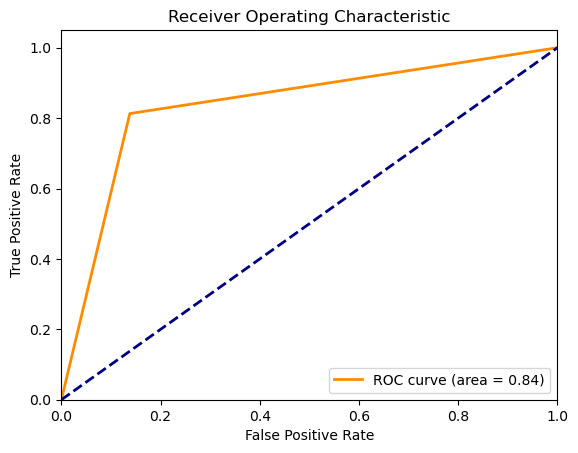

In [69]:
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, roc_auc_score
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import train_test_split
from sklearn.datasets import make_classification

# Generate a synthetic dataset (or use your own dataset)
X, y = make_classification(n_samples=1000, n_features=20, n_classes=2, random_state=42)

# Split the dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# Train the decision tree classifier
model = DecisionTreeClassifier()
model.fit(X_train, y_train)

# Predict probabilities
y_probs = model.predict_proba(X_test)[:, 1]

# Compute the ROC curve and AUC
fpr, tpr, _ = roc_curve(y_test, y_probs)
roc_auc = roc_auc_score(y_test, y_probs)

# Plot the ROC curve
plt.figure()
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')
plt.legend(loc="lower right")
plt.show()

# CONCLUSION: Logistic Regression is the best Algorithm for this dataset